# Our first operator in starting to use the software stack


[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/GP211/2023-fall-class-notebooks/blob/main/in-class/Derivative.ipynb)

In [ ]:
%load_ext autoreload
%autoreload 2
import sys



In [ ]:
! pip install  "sep_plot @ git+https://github.com/SEP-software/sep-plot.git@6331a1e36d8e3cdb4cfbc3539f31bdad1eb465a7" 

In [4]:
! wget https://github.com/GP211/2023-fall-class-notebooks/raw/main/data/bay.H

--2023-10-03 12:56:48--  https://github.com/GP211/2023-fall-class-notebooks/raw/main/data/bay.H
Resolving github.com (github.com)... 64:ff9b::c01e:ff71, 192.30.255.113
Connecting to github.com (github.com)|64:ff9b::c01e:ff71|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/GP211/2023-fall-class-notebooks/main/data/bay.H [following]
--2023-10-03 12:56:49--  https://raw.githubusercontent.com/GP211/2023-fall-class-notebooks/main/data/bay.H
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 2606:50c0:8000::154, 2606:50c0:8002::154, 2606:50c0:8001::154, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|2606:50c0:8000::154|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11539915 (11M) [application/octet-stream]
Saving to: ‘bay.H’

bay.H               100%[===================>]  11.00M  17.4MB/s    in 0.6s    

2023-10-03 12:56:50 (17.4 MB/s) - ‘bay.H’ saved [1153991

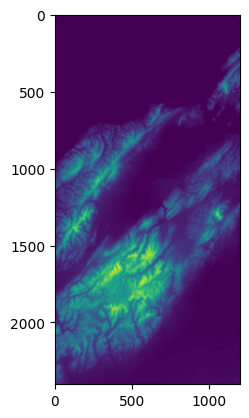

In [7]:
import matplotlib.pyplot as plt
from sep_python import default_io
vec=default_io.vector_from_storage("./bay.H")
plt.imshow(vec.get_nd_array())
v=vec.get_nd_array()


In [10]:
from abc import ABC, abstractmethod
class operator(ABC):
  """An abstract class for operators for inverse problems"""
  def __init__(self,domain,range):
    """Default initializer for an abstract class

      domain - Domain of operator
      range. - Range of operator

    """
    self._domain=domain.clone()
    self._range=range.clone()

  @abstractmethod
  def forward(self,add,model,data):
    """
      Run a forward

      add - Whether or not to add to the output
      model - Model (input)
      data. - Data (output)


    """


  @abstractmethod
  def adjoint(self,add,model,data):
    """
      Run an adjoint

      add - Whether or not to add to the output
      model - Model (output)
      data. - Data (output)


    """

  def check_same(self,model,data):
    """
      Check to see if model and data match operator initialization

        model - Model space
        data. - data space
    """
    if not self._domain.check_same(model):
      raise Exception("model and domain don't match")

    if not self._range.check_same(data):
      raise Exception("range and data don't match")


In [11]:
class deriv_op(operator):

    def __init__(self,model,data):
        super().__init__(model,data)

    def forward(self,add,model,data):
        self.check_same(model,data)
        if not add: 
            data.zero()
        m=model.get_nd_array()
        d=data.get_nd_array()
        for i in range(m.shape[0]-1):
            for j in range(m.shape[1]):
                d[i+1,j]+=m[i+1,j]-m[i,j]
    def adjoint(self,add,model,data):
        self.check_same(model,data)
        if not add: 
            model.zero()
        m=model.get_nd_array()
        d=data.get_nd_array()

        for i in range(m.shape[0]):
            for j in range(m.shape[1]-1):
                m[i,j+1]+=d[i,j+1]
                m[i,j]-=d[i,j+1]
                

In [12]:
mod=vec.clone()
dat=vec.clone()
dat.zero()
op=deriv_op(mod,dat)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
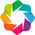

:Image   [x,y]   (z)

In [14]:
import sep_plot
op.forward(False,mod,dat)
sep_plot.Grey(dat)

## Method 2 write 1-D vector operation

In [ ]:
def forward(self,add,model,data):
    self.check_same(model,data)
    if not add: 
        data.zero()
    m=model.get_nd_array()
    d=data.get_nd_array()

    for j in range(m.shape[1]-1):
        d[:,j+1]+=m[:,j+1]-m[:,j]

## Method 3 write complete numpy vector operation

In [ ]:
def forward(self,add,model,data):
    self.check_same(model,data)
    if not add: 
        data.zero()
    m=model.get_nd_array()
    d=data.get_nd_array()

    d[:,1:]+=m[:,1:]-m[:,:-1]


## Methods 4 write in terms of numpy

In [ ]:

@numba.njit(parallel=True)
def forward_deriv(mod,dat):
    for i in numba.prange(m.shape[0]):
        for j in range(m.shape[1]-1):
            d[i,j+1]+=m[i,j+1]-m[i,j]


In [ ]:
import sep_plot

In [ ]:
sep_plot.Grey(vec)

In [ ]:
sep_plot.Grey(vec)